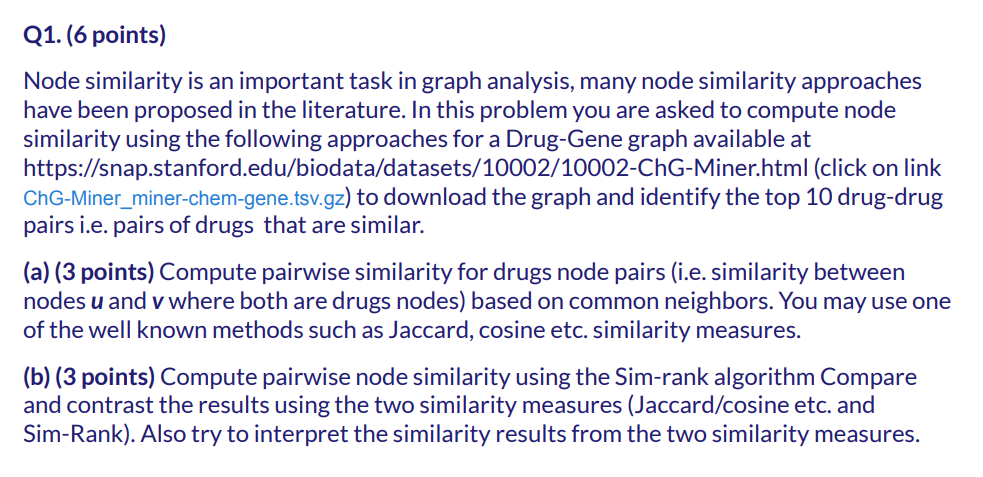

## Load Data

In [1]:
import pandas as pd
df = pd.read_csv(r"C:\Users\Admin\Documents\Bits\GAMassignment-2\ChG-Miner_miner-chem-gene.tsv", header=0, sep='\t')

In [2]:
df.count()

#Drug    15139
Gene     15139
dtype: int64

In [3]:
df.head(5)

,#Drug,Gene
0,DB00357,P05108
1,DB02721,P00325
2,DB00773,P23219
3,DB07138,Q16539
4,DB08136,P24941


In [45]:
%matplotlib inline
import matplotlib.pyplot as plt
import networkx as nx
G = nx.Graph()
G = nx.from_pandas_edgelist(df, '#Drug', 'Gene')
from matplotlib.pyplot import figure
figure(figsize=(200, 160))
nx.draw(G, with_labels=True)
plt.draw()

## (a) Compute pairwise similarity for drugs node pairs (i.e. similarity between nodes u and v where both are drugs nodes) based on common neighbors. You may use one of the well known methods such as Jaccard, cosine etc. similarity measures.


## Computing Jaccard coefficint for each pair of node in graph.

**Jaccard coeeficnt** is structural equvalance method where we club node pair with highest neibhours in comman .Shared Neibhours is calculated by Jaccard coeeficient.
For This we need to generate possible pair of nodes for which we need to calculate Jaccard coefficient.
Then use netowrkx library to compute jaccard coeeficient and save in numpy of (n)X(n) where n is total no. of nodes


In [5]:
NodeCount = df['#Drug']
Node = NodeCount.drop_duplicates()
print(Node.count())
NodeList = Node.tolist()
len(NodeList)



5018


5018

In [ ]:
NodeVal =dict()
for i in NodeList:
    for j in NodeList:
        if i != j:
            #print('i=',i,'and ','j=',j)
            jacSim = nx.jaccard_coefficient(G, [(i, j)])
            for u,v,p in jacSim:
                #print(u,v,p)
                tup1 = (u,v)
                #print(str1)
                NodeVal[tup1] = p
                

In [ ]:
from pickle import dump
dump(NodeVal, open('./NodeVal.pkl', 'wb'))

In [4]:
import pickle
# Read the data from the file
with open(r'./NodeVal.pkl', 'rb') as fid:
    NodeVal = pickle.load(fid)

In [6]:
#Top 10 values based on Jaccard Similarity
from heapq import nlargest
N = 10
jaccardSimilarityNodes = nlargest(N, NodeVal, key = NodeVal.get)
print("The top 10 value pairs are  " + str(jaccardSimilarityNodes))

The top 10 value pairs are  [('DB07138', 'DB08352'), ('DB07138', 'DB08424'), ('DB07138', 'DB08095'), ('DB07138', 'DB08097'), ('DB07138', 'DB01807'), ('DB07138', 'DB07829'), ('DB07138', 'DB08423'), ('DB07138', 'DB01948'), ('DB07138', 'DB07607'), ('DB07138', 'DB04632')]


## (b) Compute pairwise node similarity using the Sim-rank algorithm 
compare and contrast the results using the two similarity measures (Jaccard/cosine etc. and
Sim-Rank). Also try to interpret the similarity results from the two similarity measures

In [10]:
simRank = nx.simrank_similarity(G)

In [11]:
from pickle import dump
dump(simRank, open('./simRank.pkl', 'wb'))

In [7]:
import pickle
# Read the data from the file
with open(r'./simRank.pkl', 'rb') as fid:
    simRank = pickle.load(fid)

In [43]:
drugNodes = df['#Drug'].tolist()
simRank_final = dict()
for dNode in drugNodes:
    key = dNode
    simRI = simRank[key]
    #print(simRI)
    N = 2
    simRn = nlargest(N, simRI, key = simRI.get)
    #print(simRn)
    l1 = list()
    for key1 in simRn:
        if key1 != key:
            #print(simRI[key1])
            keyPair = (key, key1)
            simRank_final[keyPair] = simRI[key1]

N = 1
simNode = nlargest(N, simRank_final, key = simRank_final.get)            
            
print("Top Similar Node Pair :",simNode)

Top Similar Node Pair : [('DB07138', 'DB08352')]


### Comparison of Jaccard and SimRank output:
In both algorithm we get ('DB07138', 'DB08352') pair as output. since both algorithm based on concept that similar nodes has similar neighbours, so the outcome is same but perfromance of Jaccard Similarity is better then simRank algorithm.